In [2]:
import pmdarima as pm
import pandas as pd
import numpy as np
from pmdarima import model_selection
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

from statsmodels.tsa.stattools import acf, pacf, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose

from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from pmdarima.arima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math
import numpy as np


from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic

In [3]:
df = pd.read_csv("Merge.csv")
df.head()

,Date,Hour,Irradiance,Power,Temp,Hum
0,2021-09-01,0,0,0.0,82.0,84.0
1,2021-09-01,1,0,0.0,82.0,84.0
2,2021-09-01,2,0,0.0,82.0,86.5
3,2021-09-01,3,0,0.0,82.0,89.0
4,2021-09-01,4,0,0.0,84.0,79.0


In [4]:
df.shape

(8736, 6)

In [5]:
df=df.drop(["Hour"],axis=1)

In [6]:
df.head()

,Date,Irradiance,Power,Temp,Hum
0,2021-09-01,0,0.0,82.0,84.0
1,2021-09-01,0,0.0,82.0,84.0
2,2021-09-01,0,0.0,82.0,86.5
3,2021-09-01,0,0.0,82.0,89.0
4,2021-09-01,0,0.0,84.0,79.0


In [7]:
df.isna().sum()

Date          0
Irradiance    0
Power         0
Temp          0
Hum           0
dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8736 entries, 0 to 8735
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Date        8736 non-null   object 
 1   Irradiance  8736 non-null   int64  
 2   Power       8736 non-null   float64
 3   Temp        8736 non-null   float64
 4   Hum         8736 non-null   float64
dtypes: float64(3), int64(1), object(1)
memory usage: 341.4+ KB


In [15]:
df['Date'][720*2]

'2021-10-31'

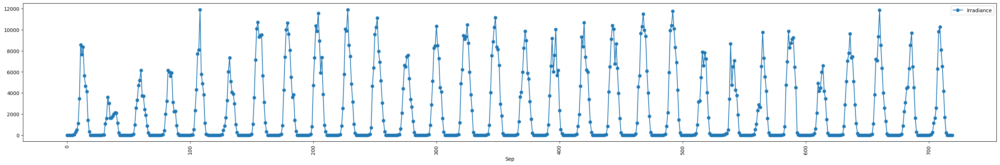

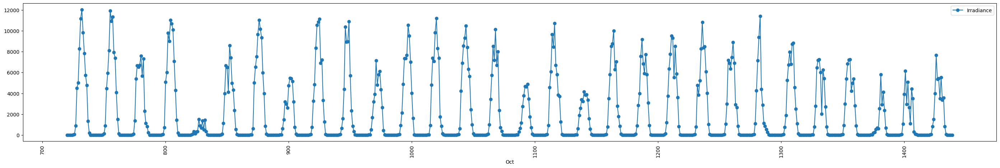

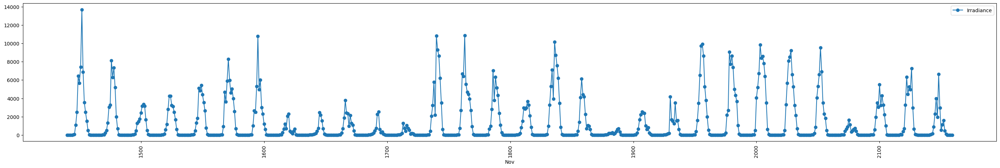

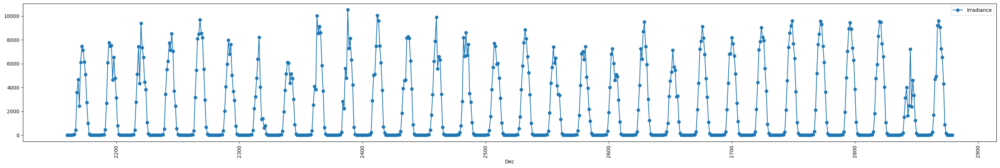

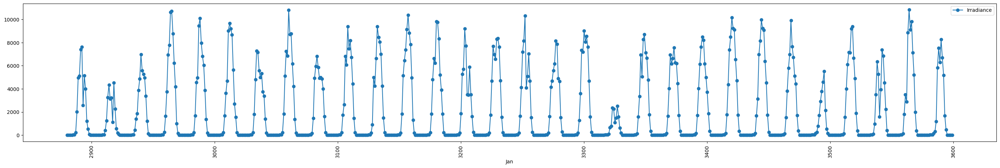

...

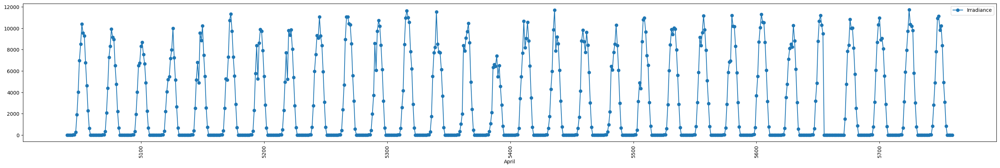

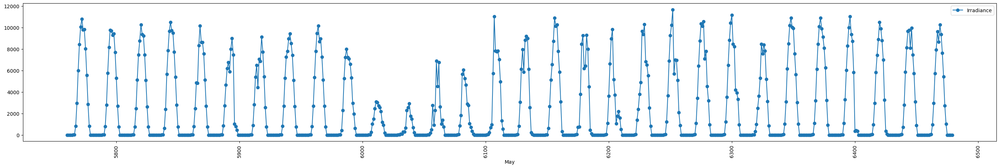

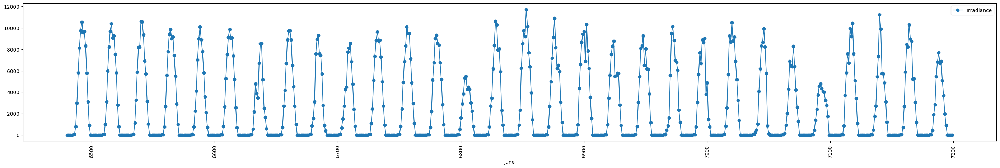

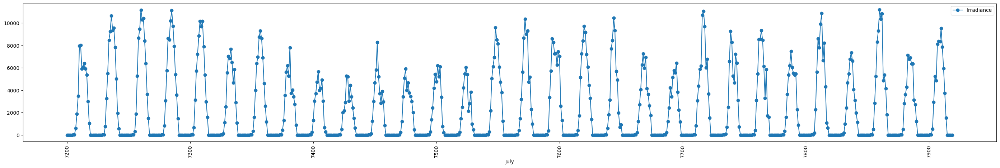

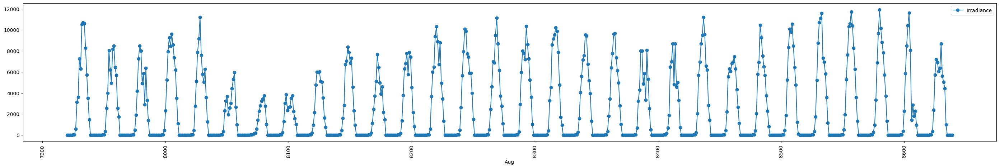

In [26]:
L=['Sep','Oct','Nov','Dec','Jan','Feb','Mar','April','May','June','July','Aug']
for i in  range(1,13): 

    plt.figure(figsize=(35,5))
    #plt.grid()
    plt.plot(df['Irradiance'][720*(i-1):720*i], marker='o', label='Irradiance')
    plt.xlabel(L[i-1])
    plt.xticks(rotation=90)
    plt.legend()
    plt.show()

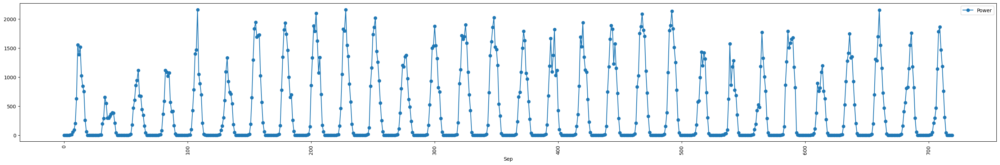

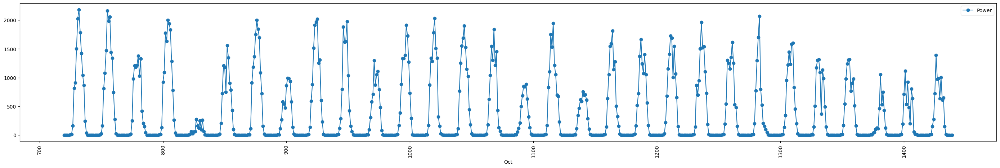

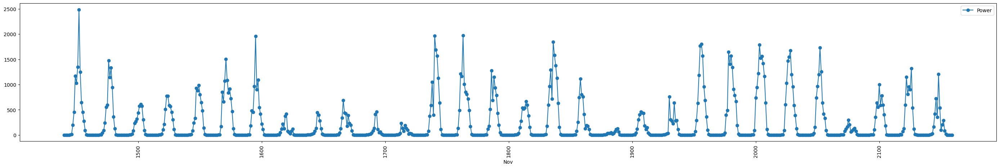

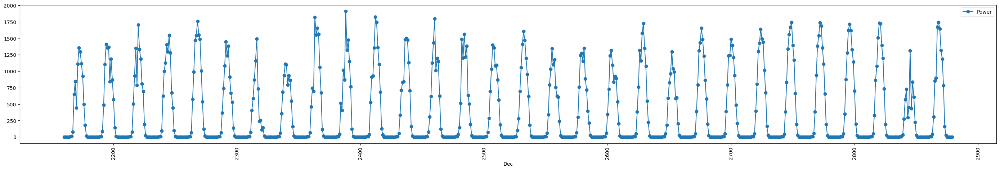

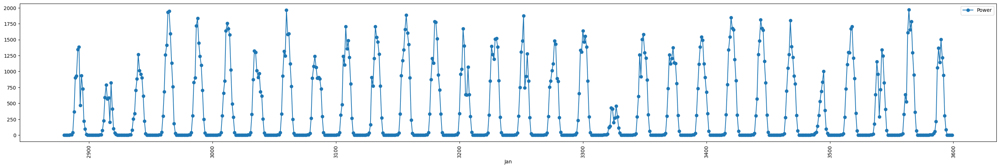

...

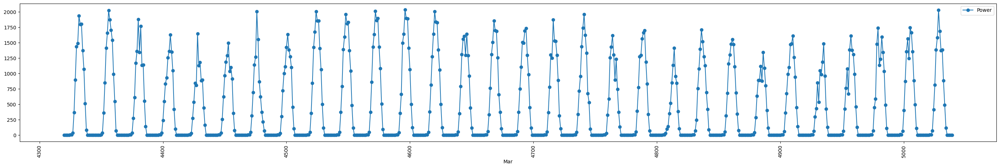

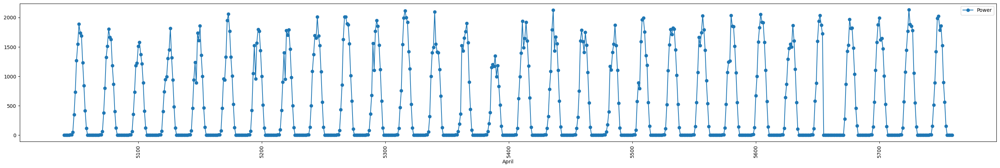

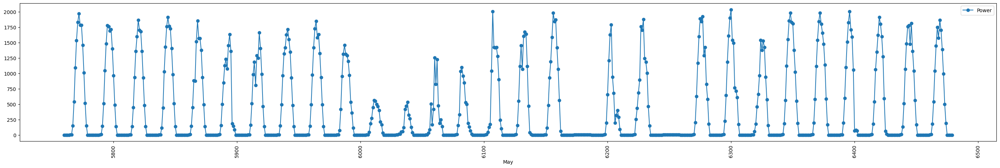

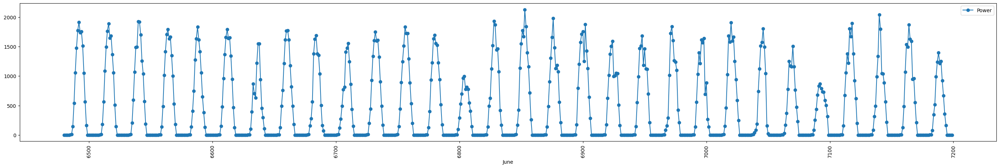

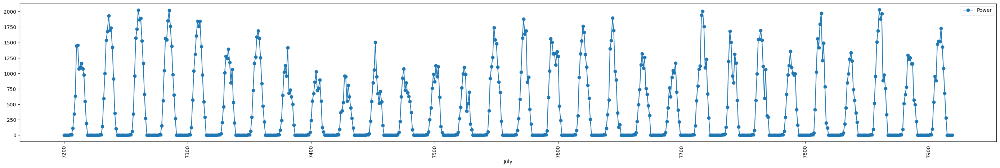

In [22]:
L=['Sep','Oct','Nov','Dec','Jan','Feb','Mar','April','May','June','July','Aug']
for i in  range(1,13): 

    plt.figure(figsize=(35,5))
    #plt.grid()
    plt.plot(df['Power'][720*(i-1):720*i], marker='o', label='Power')
    plt.xlabel(L[i-1])
    plt.xticks(rotation=90)
    plt.legend()
    plt.show()

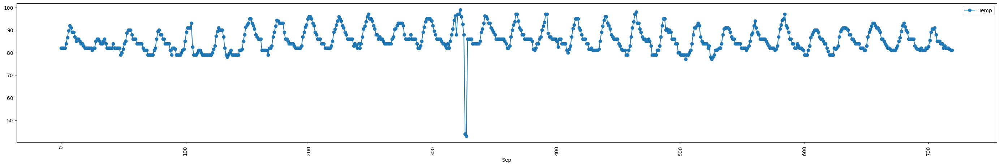

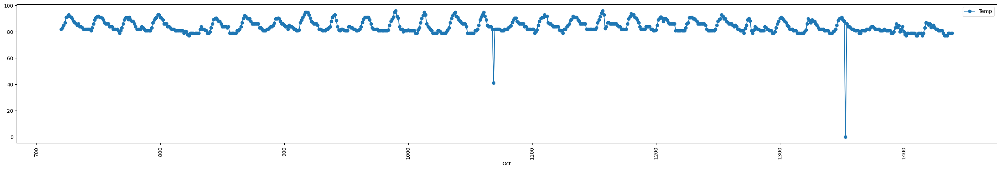

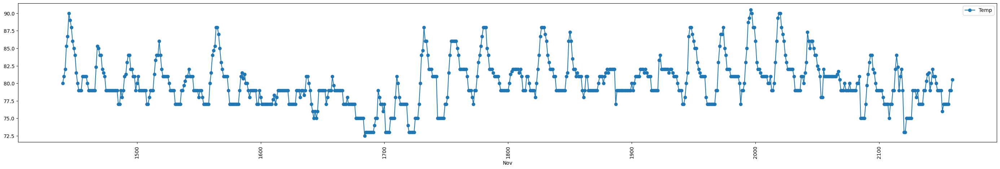

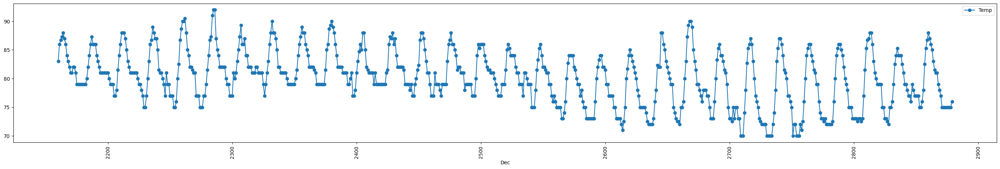

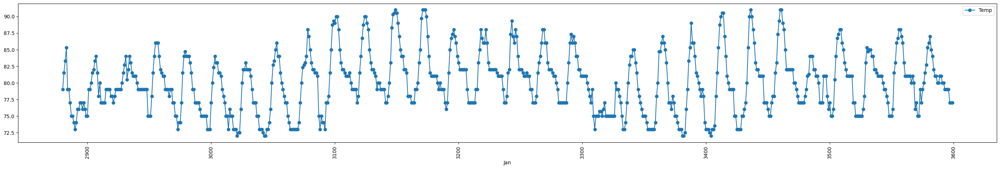

...

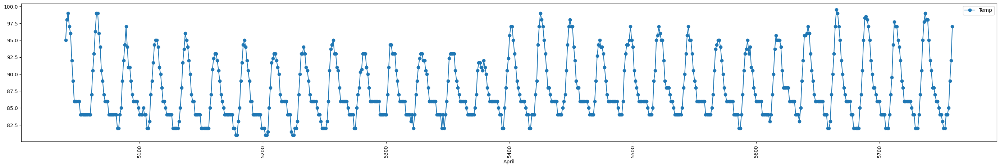

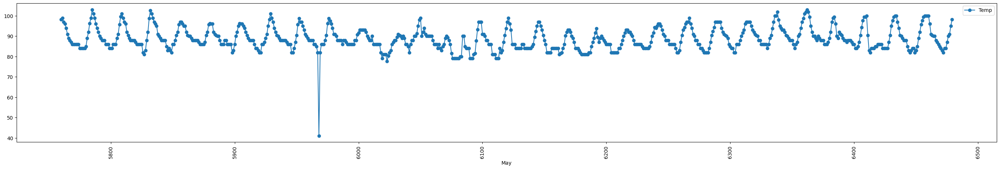

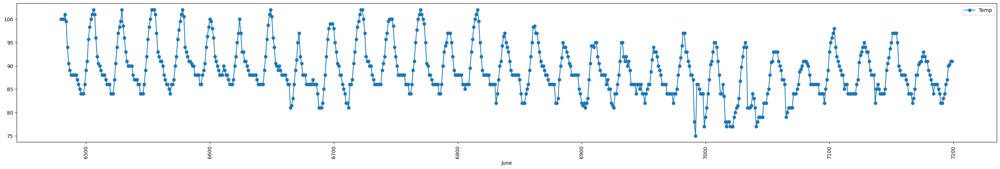

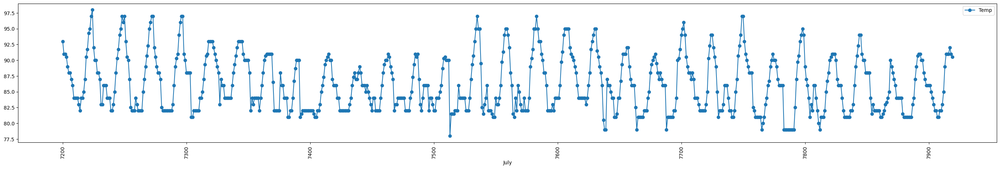

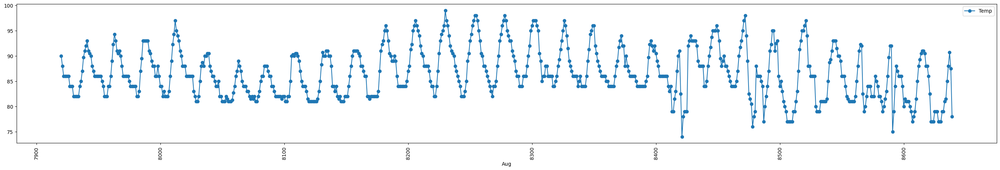

In [28]:
L=['Sep','Oct','Nov','Dec','Jan','Feb','Mar','April','May','June','July','Aug']
for i in  range(1,13): 

    plt.figure(figsize=(35,5))
    #plt.grid()
    plt.plot(df['Temp'][720*(i-1):720*i], marker='o', label='Temp')
    plt.xlabel(L[i-1])
    plt.xticks(rotation=90)
    plt.legend()
    plt.show()

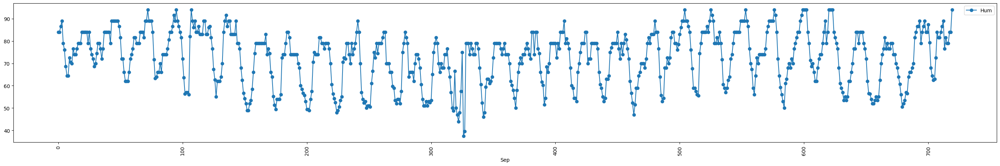

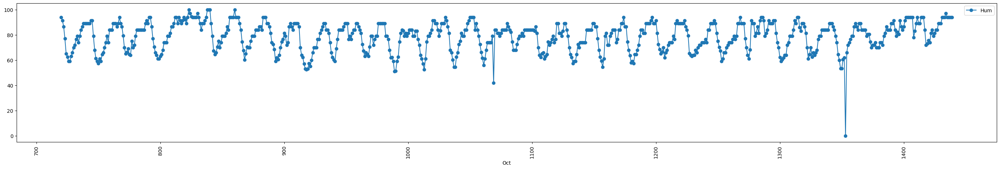

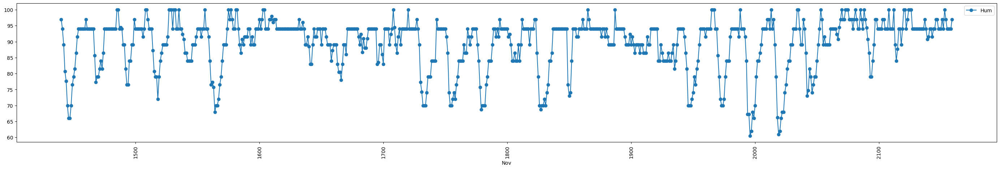

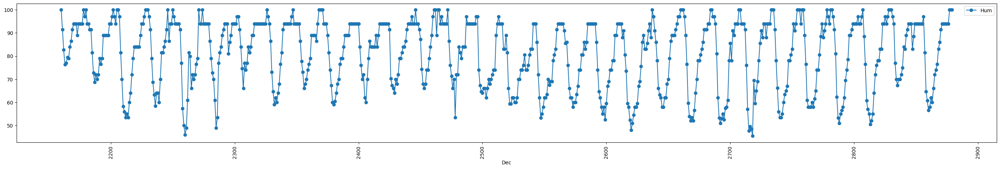

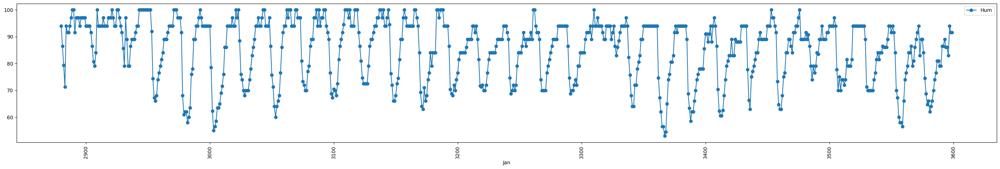

...

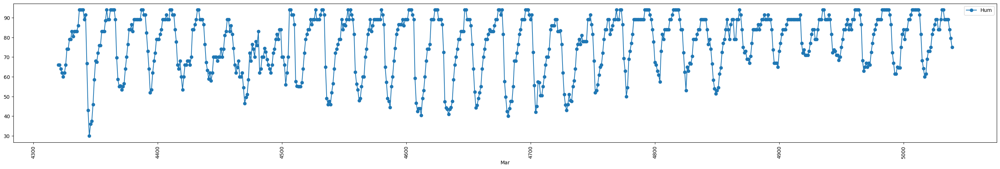

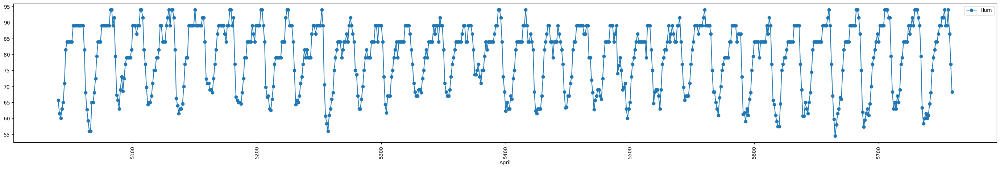

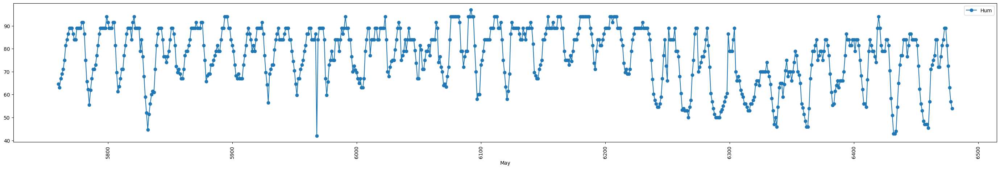

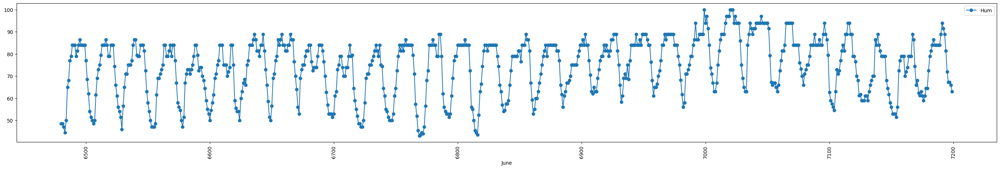

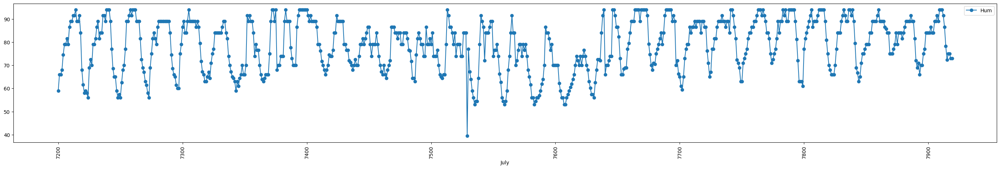

In [24]:
L=['Sep','Oct','Nov','Dec','Jan','Feb','Mar','April','May','June','July','Aug']
for i in  range(1,13): 

    plt.figure(figsize=(35,5))
    #plt.grid()
    plt.plot(df['Hum'][720*(i-1):720*i], marker='o', label='Hum')
    plt.xlabel(L[i-1])
    plt.xticks(rotation=90)
    plt.legend()
    plt.show()

**Conclusion**
* We can see the seasonality and it seems like it is repeating over a period

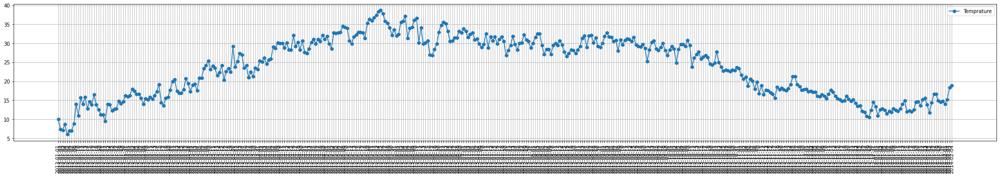

In [11]:
# Plot first 400 observation 
# Ploting the curve 
# plt.figure(figsize=(35,5))
# plt.grid()
# plt.plot(train['date'][:400],train['meantemp'][:400], marker='o', label='Temprature')
# plt.xticks(rotation=90)
# plt.legend()
# plt.show()

**Seasonal Decomposition**

In [25]:
ts_decomposition = seasonal_decompose(x=df['Power'], model='additive', period=6)
trend_estimate = ts_decomposition.trend
seasonal_estimate = ts_decomposition.seasonal
residual_estimate = ts_decomposition.resid


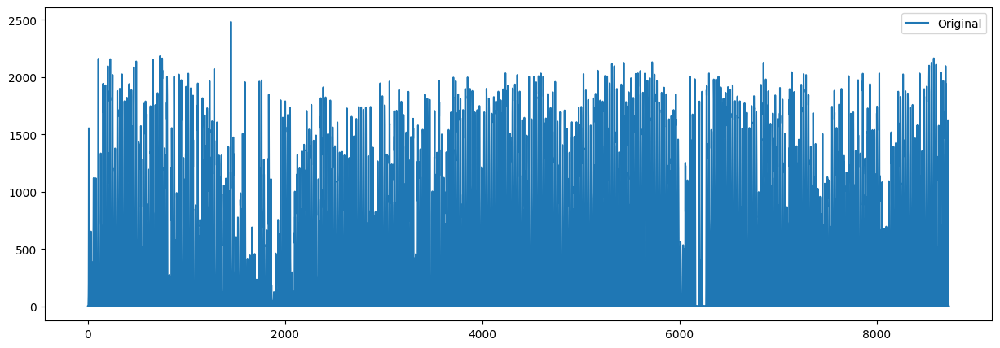

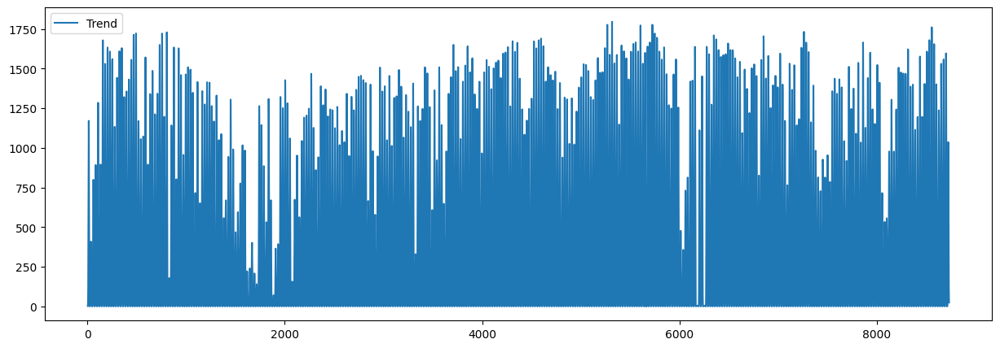

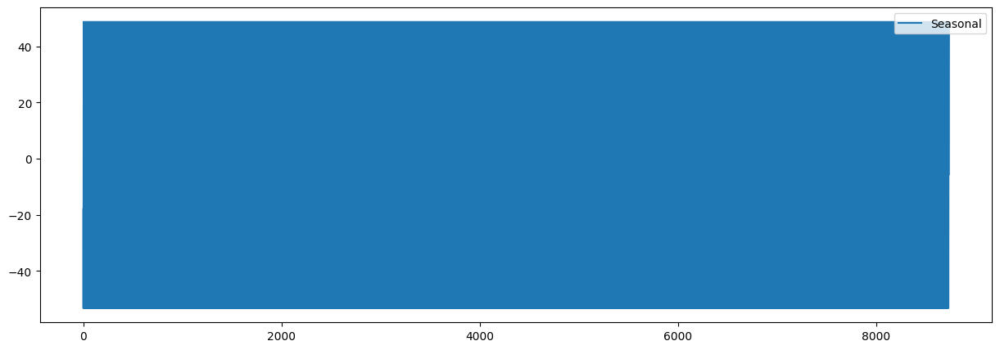

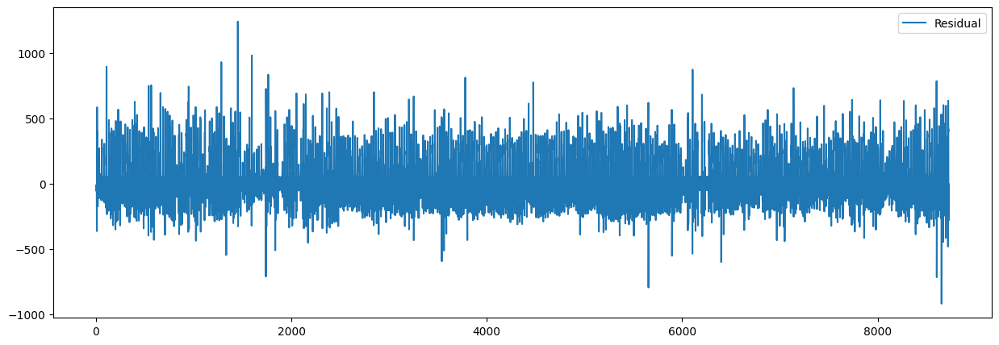

In [14]:
plt.figure(figsize=(15,5))
plt.plot(df['Power'], label='Original')
plt.legend()

plt.figure(figsize=(15,5))
plt.plot(trend_estimate, label='Trend')
plt.legend()

plt.figure(figsize=(15,5))
plt.plot(seasonal_estimate, label='Seasonal')
plt.legend()

plt.figure(figsize=(15,5))
plt.plot(residual_estimate, label='Residual')
plt.legend()

**Rolling Mean and Standard Deviation**

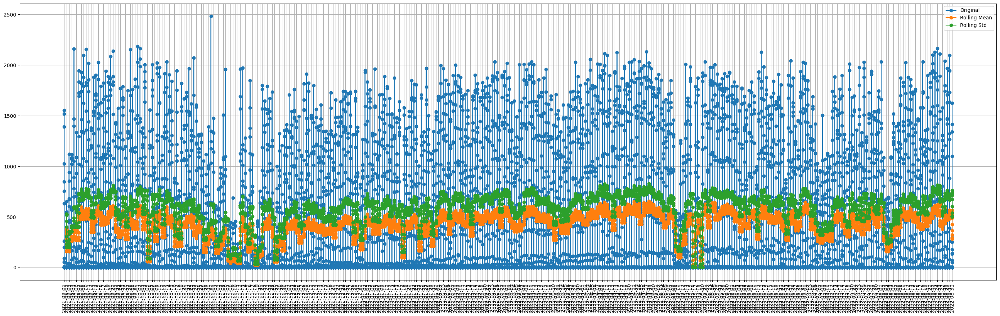

In [15]:
plt.figure(figsize=(35,10))
plt.grid()
plt.plot(df['Date'], df['Power'], marker='o', label='Original')
plt.plot(df['Date'], df['Power'].rolling(window=25).mean(), marker='o', label='Rolling Mean')
plt.plot(df['Date'], df['Power'].rolling(window=25).std(), marker='o', label='Rolling Std')
plt.xticks(rotation=90)
plt.legend()
plt.show()

**Conclusion**
* We can see that Mean is not constant. 
* Standard deviation is also not constant. 
* It is non-stationary data. 
* We'll plot for other features as well

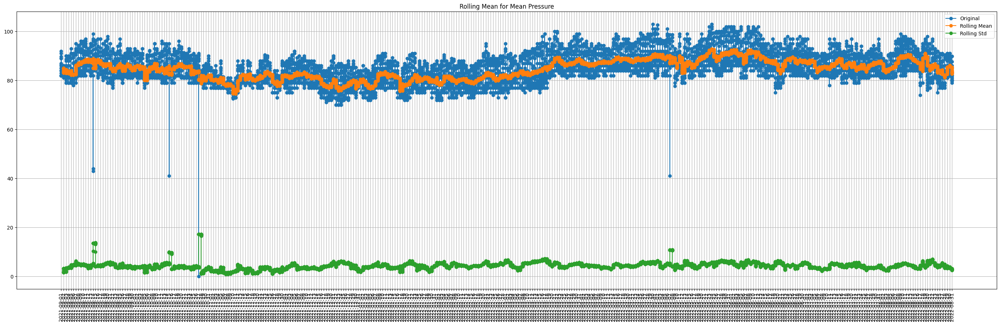

In [16]:
plt.figure(figsize=(35,10))
plt.grid()
plt.plot(df['Date'], df['Temp'], marker='o', label='Original')
plt.plot(df['Date'], df['Temp'].rolling(window=25).mean(), marker='o', label='Rolling Mean')
plt.plot(df['Date'], df['Temp'].rolling(window=25).std(), marker='o', label='Rolling Std')
plt.xticks(rotation=90)
plt.title("Rolling Mean for Mean Pressure")
plt.legend()
plt.show()

**Conclusion**
* It is constant.
* To check for stationarity we have to perform the adf test

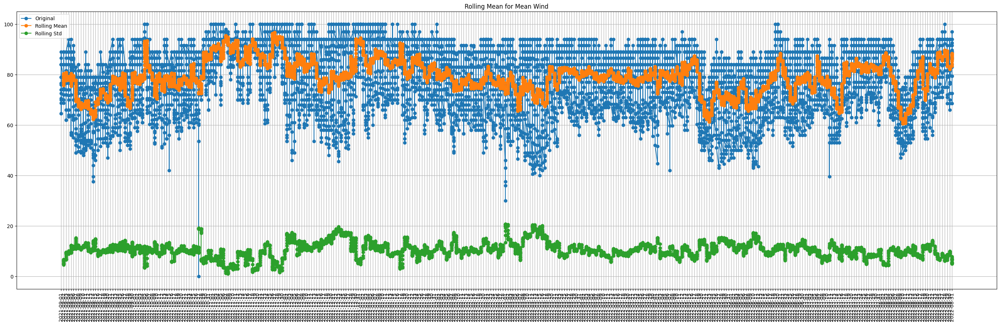

In [17]:
plt.figure(figsize=(35,10))
plt.grid()
plt.plot(df['Date'], df['Hum'], marker='o', label='Original')
plt.plot(df['Date'], df['Hum'].rolling(window=25).mean(), marker='o', label='Rolling Mean')
plt.plot(df['Date'], df['Hum'].rolling(window=25).std(), marker='o', label='Rolling Std')
plt.xticks(rotation=90)
plt.title("Rolling Mean for Mean Wind")
plt.legend()
plt.show()

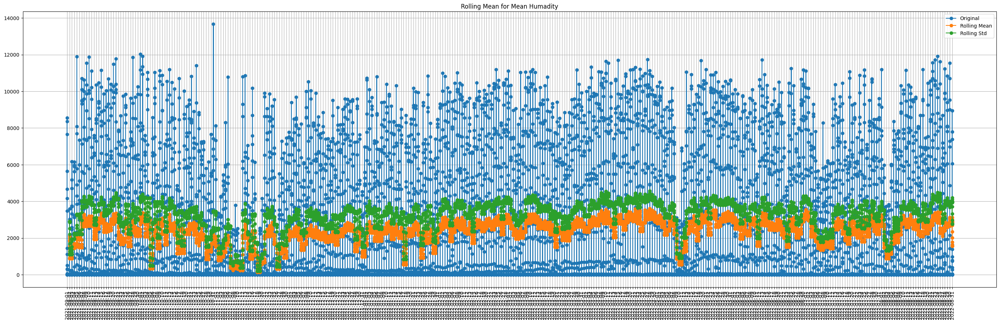

In [18]:
plt.figure(figsize=(35,10))
plt.grid()
plt.plot(df['Date'], df['Irradiance'], marker='o', label='Original')
plt.plot(df['Date'], df['Irradiance'].rolling(window=25).mean(), marker='o', label='Rolling Mean')
plt.plot(df['Date'], df['Irradiance'].rolling(window=25).std(), marker='o', label='Rolling Std')
plt.xticks(rotation=90)
plt.title("Rolling Mean for Mean Humadity")
plt.legend()
plt.show()